In [1]:
%load_ext autoreload
%autoreload 2

import os
from pathlib import Path
import numpy as np

from IPython.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))


# Override/set credentials in env var
os.environ['CWD'] = str(Path(os.getcwd()).parent)

# Base paths
cwd = Path(os.environ['CWD'])
dir_data = cwd / 'data'

import plotly.io as pio
pio.renderers.default='notebook'

In [4]:
!pip install -e ../

Obtaining file:///root/work/toptal/Ivan-Sanchez
  Running setup.py develop for author-classification
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [ ]:
# !pip install wordcloud

In [2]:
import author_classification
author_classification.__version__

'0.0.1'

In [2]:
import pandas as pd

df_tr_ev = pd.read_csv(dir_data / 'train.csv')
df_tr_ev['split'] = 'tr'
df_te = pd.read_csv(dir_data / 'test.csv')
df_te['split'] = 'te'

df = pd.concat([df_tr_ev, df_te])

# Exploratory Data Analysis

## What is the shape of the data?

In [206]:
df.shape

(41000, 4)

In [207]:
df.sample(4)

,Unnamed: 0,text,author,split
22029,22029,"”\n\n“But Mr. Fowler being a persevering man,...",doyle,tr
39792,39792,"You have heard of it\nbefore, Sandy, though ...",twain,tr
18902,18902,\n\n‘Candidly to confess everything that has o...,dickens,tr
34609,34609,"\n\nWe set out to find the centre of the city,...",twain,tr


It looks like the data only consists in an index, the passage text and the author to whom this passage pertains to

## Number of different authors and distribution

How many different authors are there?

In [3]:
df_tr_ev['author'].unique()

array(['defoe', 'dickens', 'doyle', 'twain'], dtype=object)

Is the dataset imbalanced?

In [5]:
import plotly.express as px
px.bar(df_tr_ev['author'].value_counts(), width=600, height=400)

The dataset is perfectly balanced. Let's see some statistics per author.

To get statistics per author (e.g. mean number of tokens, word rates, etc.) we need to preprocess the text

# Text preprocessing

Let's take a look at some samples to decide what pre-processing we'll do

In [6]:
df_samples = df_tr_ev.groupby('author').sample(3, random_state=288)
with pd.option_context('display.max_colwidth', None):
    display(df_samples)

,Unnamed: 0,text,author,split
1956,1956,"_The\nExplanation of the Word_ Keys, 25. _The Pyrates conceal their Booty on\nthem_, ib. _The Plunderers turn Pyrates_, 29. _The_\nSpaniards _make Reprisals_, ib. _The Names of Ships taken by them_, ib",defoe,tr
2152,2152,"Then I called him into the cabin, and told him the story;\nand we called in the men, and they told us the rest of it; but as it took\nup a great deal of time, before we had done a seaman comes to the cabin\ndoor, and called out to us that the captain bade him tell us we were\nchased by five sloops, or boats, full of men",defoe,tr
8934,8934,"The actual\nloss of time and of money incurred by such courses of conduct, is\ngenerally of less consequence than the losses arising from habitual\ndistraction of mind, and the acquisition of an acquaintanceship with a\nset of idle or silly companions",defoe,tr
10674,10674,"But he thought it better not to ask\nthe question; and walked back to the shop: thinking over all he had\nseen and heard. \n\n\n\n\n CHAPTER VI. \nOLIVER, BEING GOADED BY THE TAUNTS OF NOAH, ROUSES INTO ACTION, AND\nRATHER ASTONISHES HIM\n\n\nThe month’s trial over, Oliver was formally apprenticed",dickens,tr
13372,13372,"‘Hold up,\nSir!’\n\nThis last observation of Mr. Weller’s bore reference to a demonstration\nMr. Winkle made at the instant, of a frantic desire to throw his feet in\nthe air, and dash the back of his head on the ice",dickens,tr
15799,15799,"\n\n‘Ah,’ said Mr. John Smauker, ‘you disliked the killibeate taste,\nperhaps?’\n\n‘I don’t know much about that ‘ere,’ said Sam. ‘I thought they’d a wery\nstrong flavour o’ warm flat irons. ’\n\n‘That _is_ the killibeate, Mr",dickens,tr
26411,26411,"\n\n “It was very essential for Stapleton to get some article of Sir\n Henry’s attire so that, in case he was driven to use the dog, he\n might always have the means of setting him upon his track",doyle,tr
27370,27370,"It never recovered from the blow, and much of\n my capital was irretrievably swallowed up. And yet, if it were\n not for the loss of the charming companionship of the boys, I\n could rejoice over my own misfortune, for, with my strong tastes\n for botany and zoology, I find an unlimited field of work here,\n and my sister is as devoted to Nature as I am",doyle,tr
29594,29594,"As we reached it the fog was lifting,\nand a thin, watery sunshine was breaking through. A butler answered our\nring. \n\n“Sir James, sir!” said he with solemn face. ”\n\nWe were ushered into a dim-lit drawing-room, where an instant later we\nwere joined by a very tall, handsome, light-bearded man of fifty, the\nyounger brother of the dead scientist",doyle,tr
30032,30032,"In one was my piece of money, in the other lay four silver\ngroschen. She gazed a little while, perhaps to see if the groschen would\nvanish away; then she said, fervently:\n\n“It's true--it's true--and I'm ashamed and beg forgiveness, O dear\nmaster and benefactor!” And she ran to Satan and kissed his hand, over\nand over again, according to the Austrian custom",twain,tr


It looks like the text has a lot of special punctuation for quotations.

Counting these punctuations in each text might be a good feature because some authors might be more prone of having a specific writting style that uses more punctuations.

Anyway, to analyze the distribution of words per author, we need to preprocess the text and eliminate all the quotes, signs, etc. and leave only the pure tokens.

Also, for the analysis of the distribution of works to be the most precise as possible, we will lemmatize the words before preprocessing them.

Because some authors might be more prone to use certain verb tenses or forms, so we will also keep the non-lemmatized version, so we will end up having two texts:

- Text → Lemmatize → Process
- Text → Process

And when we build a classifier, we will see which one works better for this use case

In [9]:
# Dictionary of English Contractions
DICT_CONTRACTIONS = {"ain't": "are not","'s":" is","aren't": "are not",
                     "can't": "cannot","can't've": "cannot have",
                     "'cause": "because","could've": "could have","couldn't": "could not",
                     "couldn't've": "could not have", "didn't": "did not","doesn't": "does not",
                     "don't": "do not","hadn't": "had not","hadn't've": "had not have",
                     "hasn't": "has not","haven't": "have not","he'd": "he would",
                     "he'd've": "he would have","he'll": "he will", "he'll've": "he will have",
                     "how'd": "how did","how'd'y": "how do you","how'll": "how will",
                     "I'd": "I would", "I'd've": "I would have","I'll": "I will",
                     "I'll've": "I will have","I'm": "I am","I've": "I have", "isn't": "is not",
                     "it'd": "it would","it'd've": "it would have","it'll": "it will",
                     "it'll've": "it will have", "let's": "let us","ma'am": "madam",
                     "mayn't": "may not","might've": "might have","mightn't": "might not", 
                     "mightn't've": "might not have","must've": "must have","mustn't": "must not",
                     "mustn't've": "must not have", "needn't": "need not",
                     "needn't've": "need not have","o'clock": "of the clock","oughtn't": "ought not",
                     "oughtn't've": "ought not have","shan't": "shall not","sha'n't": "shall not",
                     "shan't've": "shall not have","she'd": "she would","she'd've": "she would have",
                     "she'll": "she will", "she'll've": "she will have","should've": "should have",
                     "shouldn't": "should not", "shouldn't've": "should not have","so've": "so have",
                     "that'd": "that would","that'd've": "that would have", "there'd": "there would",
                     "there'd've": "there would have", "they'd": "they would",
                     "they'd've": "they would have","they'll": "they will",
                     "they'll've": "they will have", "they're": "they are","they've": "they have",
                     "to've": "to have","wasn't": "was not","we'd": "we would",
                     "we'd've": "we would have","we'll": "we will","we'll've": "we will have",
                     "we're": "we are","we've": "we have", "weren't": "were not","what'll": "what will",
                     "what'll've": "what will have","what're": "what are", "what've": "what have",
                     "when've": "when have","where'd": "where did", "where've": "where have",
                     "who'll": "who will","who'll've": "who will have","who've": "who have",
                     "why've": "why have","will've": "will have","won't": "will not",
                     "won't've": "will not have", "would've": "would have","wouldn't": "would not",
                     "wouldn't've": "would not have","y'all": "you all", "y'all'd": "you all would",
                     "y'all'd've": "you all would have","y'all're": "you all are",
                     "y'all've": "you all have", "you'd": "you would","you'd've": "you would have",
                     "you'll": "you will","you'll've": "you will have", "you're": "you are",
                     "you've": "you have"}

import re
# Regular expression for finding contractions
REGEX_CONTRACTIONS = re.compile('(%s)' % '|'.join(DICT_CONTRACTIONS.keys()))

# Function for expanding contractions (borrowed)
def expand_contractions(txt):
    num_replacements = 0
    def replace(match):
        nonlocal num_replacements
        num_replacements += 1
        return DICT_CONTRACTIONS[match.group(0)]
    return (REGEX_CONTRACTIONS.sub(replace, txt), num_replacements)



In [129]:
import re

CHARS_QUOTE = '''«»‹›„“‟”’"❝❞❮❯⹂〝〞〟＂'''
REGEX_ALL_QUOTES = '|'.join([re.escape(c) for c in CHARS_QUOTE])

CHARS_APOSTROPHE = '''’‘‛❛❜❟'''
REGEX_ALL_APOSTROPHES = '|'.join([re.escape(c) for c in CHARS_APOSTROPHE])

CHARS_PARENTHESIS = '''()[]'''
CHARS_HYPHEN = '-–—−‧'
CHARS_EXCLAM_QUESTI = '?!'
CHARS_PUNCT_STOP = '.'
CHARS_PUNCT_PAUSES = ',;:'
CHARS_UNDERSCORE = '_'
CHARS_SPECIAL = '£&{}$*'

CHARS_ALL = CHARS_QUOTE + CHARS_APOSTROPHE + CHARS_PARENTHESIS + CHARS_HYPHEN + CHARS_EXCLAM_QUESTI + CHARS_PUNCT_STOP + CHARS_PUNCT_PAUSES + CHARS_UNDERSCORE + CHARS_SPECIAL
REGEX_ALL_CHARS_SUB = '|'.join([re.escape(c) for c in CHARS_ALL])


# Text features
def char_freq(text, list_chars):
    '''
    Returns the number of characters in text that are in the specified `list_chars`
    '''
    return len([c for c in text if c in list_chars])

def char_freq_ratio(text, list_chars):
    '''
    Returns the ratio n_chars/text_length_in_chars of characters in text that are in the specified `list_chars`
    '''
    return char_freq(text, list_chars) / len(text)

In [135]:
import re
def normalize_spaces(txt):
    '''
    Returns the text with the different kinds of spaces (newline, tab, space, nonbreaking space, etc.) converted to one space
    '''
    return re.sub('(\s|\t|\n)+', ' ', txt)


def normalize_quotes(txt):
    '''
    Returns the text with the different kinds of quotes (« » ‹ › “ ‟ ” " ❝ ❞ ❮ ❯ ⹂ 〝 〞 〟 ＂) converted to normal quote (") 
    '''
    return re.sub(REGEX_ALL_QUOTES, '"', txt)


def normalize_apostrophes(txt):
    '''
    Returns the text with the different kinds of apostrophes (’ ‘ ‛ ❛ ❜ ❟) converted to normal apostrophe (') 
    '''
    return re.sub(REGEX_ALL_APOSTROPHES, "'", txt)



def remove_punct(txt):
    '''
    Returns the text with the characters defined by `REGEX_ALL_CHARS_SUB` substituted by one space
    '''
    return re.sub(REGEX_ALL_CHARS_SUB, ' ', txt)

def remove_single_quotes(txt):
    '''
    Remove single quote in a not generic way, to avoid removing contractions (e.g. they've)
        https://regex101.com/r/oGSErP/1
    '''
    return re.sub('''(?<!\w)'|'(?!\w)''', '', txt)
    
    
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt', quiet=True)
STOPWORDS_EN = set(stopwords.words('english'))
 
def remove_stopwords(txt):
    return ' '.join([w for w in word_tokenize(txt) if w.lower() not in STOPWORDS_EN])


def preprocess_text(txt, lemmatize=False):
    for fn in [
        normalize_quotes,
        normalize_apostrophes,
        lambda txt: expand_contractions(txt)[0],
        (lambda txt: txt) if not lemmatize else lemmatize_text, # if lemmatize is False, use identity function, otherwise lemmatize at this point
        remove_punct,
        normalize_spaces,
        remove_single_quotes,
        lambda txt: txt.lower(),
        remove_stopwords,
        lambda txt: re.sub(" ' ", '', txt) # For certain texts, after processing there might be some residual apostrophes that should be removed
    ]:
        txt = fn(txt)
    return txt


from functools import partial
def get_text_punctuation_stat_features(txt):
    list_funcs = []
    list_feature_names = []
    
    for fname, fn in [
            ('char_freq', char_freq),
            ('char_freq_ratio', char_freq_ratio),
        ]:
        for charset_name, charset in [
            ('quote', CHARS_QUOTE),
            ('apostrophe', CHARS_APOSTROPHE),
            ('parenthesis', CHARS_PARENTHESIS),
            ('hyphen', CHARS_HYPHEN),
            ('exclam_questi', CHARS_EXCLAM_QUESTI),
            ('punct_stop', CHARS_PUNCT_STOP),
            ('punct_pauses', CHARS_PUNCT_PAUSES),
            ('underscore', CHARS_UNDERSCORE),
            ('special', CHARS_SPECIAL)
        ]:
            list_funcs.append(partial(fn, list_chars=charset))
            list_feature_names.append(f'{fname}_{charset_name}')
            
            
    list_funcs.append(lambda txt: expand_contractions(txt)[1]) # Count contractions
    list_feature_names.append('num_expanded_contractions')

    return {list_feature_names[i]:list_funcs[i](txt) for i in range(len(list_feature_names))}

In [136]:
from tqdm import tqdm 
tqdm.pandas()
df_tr_ev['text_processed'] = df_tr_ev['text'].progress_apply(preprocess_text)

100%|███████████████████████████████████| 40000/40000 [00:11<00:00, 3340.30it/s]


In [134]:
df_tr_ev['dict_punct_features'] = df_tr_ev['text'].progress_apply(get_text_punctuation_stat_features)

100%|███████████████████████████████████| 40000/40000 [00:08<00:00, 4852.65it/s]


In [137]:
def expand_col_dicts(df, colname_dict):
    return pd.concat([
        df.reset_index(),
        pd.json_normalize(df[colname_dict]).reset_index(drop=True),
    ], axis=1).set_index('index').drop(colname_dict, axis=1)

In [138]:
df_tr_ev = expand_col_dicts(df_tr_ev, colname_dict='dict_punct_features')

In [139]:
df_samples = df_tr_ev.groupby('author').sample(1, random_state=288)
with pd.option_context('display.max_colwidth', None):
    display(df_samples[['text', 'text_processed']])

,text,text_processed
index,,
1956,"_The\nExplanation of the Word_ Keys, 25. _The Pyrates conceal their Booty on\nthem_, ib. _The Plunderers turn Pyrates_, 29. _The_\nSpaniards _make Reprisals_, ib. _The Names of Ships taken by them_, ib",explanation word keys 25 pyrates conceal booty ib plunderers turn pyrates 29 spaniards make reprisals ib names ships taken ib
10674,"But he thought it better not to ask\nthe question; and walked back to the shop: thinking over all he had\nseen and heard. \n\n\n\n\n CHAPTER VI. \nOLIVER, BEING GOADED BY THE TAUNTS OF NOAH, ROUSES INTO ACTION, AND\nRATHER ASTONISHES HIM\n\n\nThe month’s trial over, Oliver was formally apprenticed",thought better ask question walked back shop thinking seen heard chapter vi oliver goaded taunts noah rouses action rather astonishes month trial oliver formally apprenticed
26411,"\n\n “It was very essential for Stapleton to get some article of Sir\n Henry’s attire so that, in case he was driven to use the dog, he\n might always have the means of setting him upon his track",essential stapleton get article sir henry attire case driven use dog might always means setting upon track
30032,"In one was my piece of money, in the other lay four silver\ngroschen. She gazed a little while, perhaps to see if the groschen would\nvanish away; then she said, fervently:\n\n“It's true--it's true--and I'm ashamed and beg forgiveness, O dear\nmaster and benefactor!” And she ran to Satan and kissed his hand, over\nand over again, according to the Austrian custom",one piece money lay four silver groschen gazed little perhaps see groschen would vanish away said fervently true true ashamed beg forgiveness dear master benefactor ran satan kissed hand according austrian custom


In [140]:
import spacy

In [141]:
# !python3 -m spacy download en_core_web_sm

In [142]:
nlp = spacy.load("en_core_web_sm", disable=['parser','ner'])
def lemmatize_text(txt):
    return ' '.join([tok.lemma_ for tok in nlp(txt)])

In [143]:
df_tr_ev['text_lemmatized_processed'] = df_tr_ev['text'].progress_apply(lambda txt: preprocess_text(txt, lemmatize=True))

100%|████████████████████████████████████| 40000/40000 [03:05<00:00, 215.94it/s]


# Lexical analysis of texts

## Word frequency of whole corpus

In [144]:
from collections import Counter

NUM_TOP_WORDS = 50

def most_common_words(txt, n=NUM_TOP_WORDS):
    return Counter(word_tokenize(txt)).most_common(n)

def plot_most_common_words_freq(list_tuples_from_counter, height=1000, width=500, orientation='h'):
    if orientation == 'h':
        y = [x[0] for x in list_tuples_from_counter]
        x = [x[1] for x in list_tuples_from_counter]
    elif orientation == 'v':
        height, width = width, height
        y = [x[1] for x in list_tuples_from_counter]
        x = [x[0] for x in list_tuples_from_counter]
    else:
        raise ValueError('Orientation has to be `h` or `v`')
    fig = px.bar(
        y=y,
        x=x,
        orientation=orientation
    ).update_layout(
        xaxis=dict(tickfont=dict(size=8)),
        height=height,
        width=width,
        yaxis_title='Count',
        xaxis_title='Word'
    )
    
    if orientation == 'h':
        fig.update_layout(
        yaxis_title='Word',
        xaxis_title='Count',
        yaxis=dict(
            autorange='reversed'
        )
    )
    
    return fig



# Top 50 Most common words in the dataset
all_dataset_text = ' '.join(df_tr_ev['text_lemmatized_processed'])
most_common_global_w_freq = most_common_words(all_dataset_text)
most_common_global_words = list(zip(*most_common_global_w_freq))[0]

fig = plot_most_common_words_freq(most_common_global_w_freq, orientation='v')
fig.update_layout(title='Top 50 most frequent words in all corpus')

In [31]:
# import io

# def pil_to_pngbytes(img_pil):
#     buf = io.BytesIO()
#     img_pil.save(buf, format='PNG')
#     return buf.getvalue()

# def pil_to_widget(img_pil):
#     return widgets.Image(value=pil_to_pngbytes(img_pil))

## Word frequency per author

In [145]:
# Concatenate all texts for each author and generate a wordcloud
df_concat_texts_author = df_tr_ev.groupby('author')['text_lemmatized_processed'].apply(lambda l: ' '.join(l)).to_frame()

# Generate a wordcloud
from wordcloud import WordCloud
wc = WordCloud(scale=1.3, background_color="white")
df_concat_texts_author['wordcloud'] = df_concat_texts_author['text_lemmatized_processed'].apply(lambda txt: wc.generate(txt).to_image())

In [146]:
from typing import List, Tuple
import PIL
def plot_wordclouds(list_tuples_title_wordcloud:List[Tuple[str, PIL.Image.Image]]):
    '''
    list_tuples_title_wordcloud: in the form of: [('author0', pil_img_wordcloud0), ('author1', pil_img_wordcloud1), ...]
    '''
    import matplotlib.pyplot as plt
    from math import ceil

    num_authors = len(list_tuples_title_wordcloud)
    num_cols_plot_wordcloud = 2
    num_rows_plot_wordcloud = ceil(num_authors / num_cols_plot_wordcloud)

    fig, axes = plt.subplots(num_rows_plot_wordcloud, num_cols_plot_wordcloud, figsize=(18, 10))

    idx = 0
    for i in range(num_rows_plot_wordcloud):
        for j in range(num_cols_plot_wordcloud):
            if idx == num_authors:
                break
            ax = axes[i, j]
            ax.imshow(list_tuples_title_wordcloud[idx][1])
            ax.axis('off');
            ax.set_title(list_tuples_title_wordcloud[idx][0], fontsize=30)
            idx += 1

### Wordcloud

A wordcloud shows the most common words of a text in a very depictive and visual manner

In this case, the texts are all the text blobs for each author concatenated

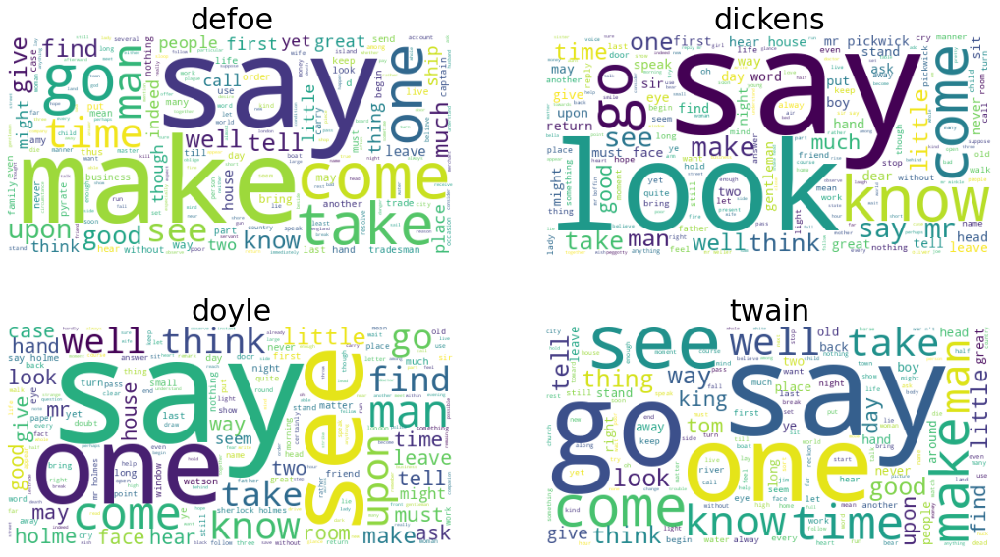

In [147]:
plot_wordclouds(list(df_concat_texts_author['wordcloud'].items()))

In [148]:
df_concat_texts_author['hist_most_common'] = df_concat_texts_author['text_lemmatized_processed'].apply(
    lambda txt: plot_most_common_words_freq(most_common_words(txt), height=1000, width=300)
)

In [149]:
import plotly
from plotly.subplots import make_subplots
from math import ceil
    
def plot_vertical_histograms_sidebyside(
    list_tuples_titles_histogram_figures: List[Tuple[str, plotly.graph_objs._figure.Figure]]
):
    num_row_plots = 1
    num_col_plots = len(list_tuples_titles_histogram_figures)
    fig = make_subplots(
        rows=num_row_plots,
        cols=num_col_plots,
        subplot_titles=([t[0] for t in list_tuples_titles_histogram_figures])
    )
    
    for i in range(num_col_plots):
        subfig_data = list_tuples_titles_histogram_figures[i][1].data
        assert len(subfig_data) == 1
        fig.add_trace(
            subfig_data[0],
            row=1, col=i+1
        )
        
        fig.update_yaxes(row=1, col=i+1, autorange='reversed')
        
    fig.update_layout(
        height=1000,
        width=1200,
        yaxis_title='Word',
        xaxis_title='Count',
    )

    return fig

### Word frequency histograms

A word frequency histogram per author can let us dig down into the specific word count for each author and each word, apart from comparing easily their distributions between authors

In [150]:
plot_vertical_histograms_sidebyside(list(df_concat_texts_author['hist_most_common'].items()))

**Looks like there are a lot of words that are the most common for all authors.**

Therefore, the analysis should be redone after removing the most common words globally





_Also note_: After the heavy text processing, some texts can still have some `'n` tokens. This is intended, as it's the result of tokenizing contracted words that were not the usual ones found in `DICT_CONTRACTIONS`.

This happens because of how the author writes some verbs with past tense. Therefore, it can be especially useful to keep track of these forms, especially to detect this style, and therefore correctly categorize the author

## Word frequency per author after removing global most common words

In [151]:
df_concat_texts_author['text_lemmatized_processed_wo_most_common_global'] = df_concat_texts_author['text_lemmatized_processed'].apply(
    lambda txt: ' '.join([w for w in word_tokenize(txt) if w not in most_common_global_words])
)
df_concat_texts_author['wordcloud_wo_most_common_global'] = df_concat_texts_author['text_lemmatized_processed_wo_most_common_global'].apply(lambda txt: wc.generate(txt).to_image())

### Wordcloud

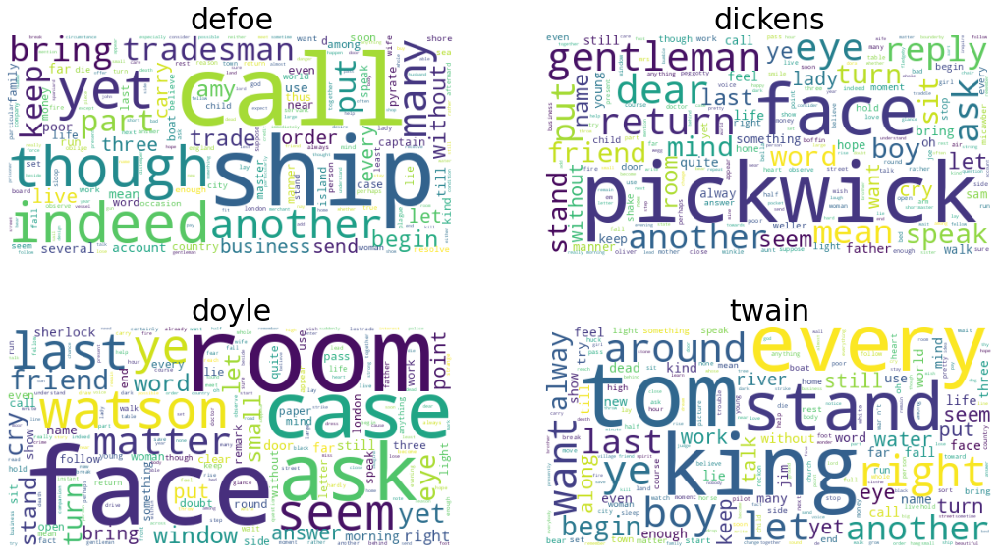

In [152]:
plot_wordclouds(list(df_concat_texts_author['wordcloud_wo_most_common_global'].items()))

Now we can really see some interesting common words for each author. For example:
- "_Holmes_", "_Watson_", "_room_" for Doyle (from Sherlock holmes) and more related words of crime scene investigation ("_face_", "_window_", "_look_", "_case_", ...)
- "_Tom_" for Twain (from Tom Sawyer)
- "_Ship_", "_tradesman_" for Defoe (from Robinson Crusoe)

In [155]:
df_concat_texts_author['hist_most_common_wo_most_common_global'] = df_concat_texts_author['text_lemmatized_processed_wo_most_common_global'].apply(
    lambda txt: plot_most_common_words_freq(most_common_words(txt), height=1000, width=300)
)

### Word frequency histograms

In [156]:
plot_vertical_histograms_sidebyside(list(df_concat_texts_author['hist_most_common_wo_most_common_global'].items()))

Also, it might be interesting to see the most frequent bigrams, to see the clearest dependencies between the words for each author

In [157]:
df_concat_texts_author['text_lemmatized_processed_tokens'] = df_concat_texts_author['text_lemmatized_processed'].apply(word_tokenize)

In [160]:
from nltk.util import ngrams
df_concat_texts_author['text_lemmatized_processed_bigrams'] = df_concat_texts_author['text_lemmatized_processed_tokens'].apply(
    lambda l: [' '.join(x) for x in list(ngrams(l, 2))]
)

### Bigram frequency histograms

In [161]:
df_concat_texts_author['top_freq_bigrams'] = df_concat_texts_author['text_lemmatized_processed_bigrams'].apply(
    lambda l: Counter(l).most_common(NUM_TOP_WORDS)
)

df_concat_texts_author['top_freq_bigrams_hist'] = df_concat_texts_author['top_freq_bigrams'].apply(plot_most_common_words_freq)

plot_vertical_histograms_sidebyside(list(df_concat_texts_author['top_freq_bigrams_hist'].items()))

In [60]:
# !pip install TextBlob==0.17.1

## Topic modelling

Apart from analyzing the plain frequency of words throughout the entire authors' texts, it might also be interesting and insightful to do Topic Modelling.

Topic Modelling might be especially helpful if we have different books/stories/worlds for each author, because it:

1. Analyses how likely are words to appear together in the same passage/blob, and
2. Also "clusterizes" these topics, and it shows the different ones within the space of the author

In [162]:
df_author = df_tr_ev[df_tr_ev['author'] == 'twain']

In [163]:
from gensim.models import LdaMulticore
from gensim import corpora

def generate_topic_models(df_author, colname_text='text_lemmatized_processed', num_topics=10, bigrams=True):
    if bigrams:
        fn_tokenize = lambda txt: [' '.join(tuple_bigram) for tuple_bigram in list(ngrams(word_tokenize(txt), 2))]
    else:
        fn_tokenize = word_tokenize
    tokenized_texts_author = df_author[colname_text].apply(fn_tokenize)
    id2word = corpora.Dictionary(tokenized_texts_author)

    corpus = [id2word.doc2bow(text) for text in tokenized_texts_author]
    
    lda = LdaMulticore(corpus=corpus,
                   id2word=id2word,
                   num_topics=num_topics,
                   random_state=288)
    return {
        'lda_model': lda,
        'corpus': corpus,
        'id2word': id2word,
        'str_topics': lda.print_topics()
    }


In [164]:
d_ret_topic_modeling = generate_topic_models(df_author)

In [165]:
import pyLDAvis.gensim
import pyLDAvis

def plot_topic_models(d_ret_topic_modeling):
    # Visualize the topics
    pyLDAvis.enable_notebook()

    results_LDAavis = pyLDAvis.gensim.prepare(
        d_ret_topic_modeling['lda_model'],
        d_ret_topic_modeling['corpus'],
        d_ret_topic_modeling['id2word']
    )

    return pyLDAvis.display(results_LDAavis)

In [166]:
plot_topic_models(d_ret_topic_modeling)

/usr/local/lib/python3.7/dist-packages/pyLDAvis/_prepare.py:248: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



/usr/local/lib/python3.7/dist-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/usr/local/lib/python3.7/dist-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/usr/local/lib/python3.7/dist-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/usr/local/lib/python3.7/dist-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload


# Semantic analysis

After the lexical analysis, let's also analyze semantic aspects of the texts, like polarity.

In [220]:
import textstat
from textblob import TextBlob
nltk.download('averaged_perceptron_tagger', quiet=True)
nltk.download('brown', quiet=True)


def set_text_polarity_subjectivity(df, colname_text='text'):
    '''
    Sentiment analysis should always be computed in unprocessed text
    '''
    df['sentiment'] = df[colname_text].progress_apply(lambda txt: TextBlob(txt).sentiment)
    df['polarity'] = df['sentiment'].apply(lambda sentiment: sentiment.polarity)
    df['subjectivity'] = df['sentiment'].apply(lambda sentiment: sentiment.polarity)
    return df.drop('sentiment', axis=1)


LIST_TUPLES_READABILITY_STATISTICS = [
        ('flesch_reading_ease', textstat.flesch_reading_ease),
        ('flesch_kincaid_grade', textstat.flesch_kincaid_grade),
        ('gunning_fog', textstat.gunning_fog),
        ('automated_readability_index', textstat.automated_readability_index),
        ('coleman_liau_index', textstat.coleman_liau_index),
        ('linsear_write_formula', textstat.linsear_write_formula),
        ('dale_chall_readability_score', textstat.dale_chall_readability_score),
        ('mcalpine_eflaw', textstat.mcalpine_eflaw),
        ('reading_time', textstat.reading_time),
        ('syllable_count', textstat.syllable_count),
        ('lexicon_count', textstat.lexicon_count),
        ('char_count', textstat.char_count),
        ('letter_count', textstat.letter_count),
        ('polysyllabcount', textstat.polysyllabcount),
        ('monosyllabcount', textstat.monosyllabcount)
    ]

def set_text_readability_statistics(df, colname_text='text'):
    '''
    Readability statistics should always be computed on unprocessed text
    '''
    for new_colname, fn in tqdm(LIST_TUPLES_READABILITY_STATISTICS):
        df[new_colname] = df[colname_text].apply(fn)
    return df

In [90]:
# !pip install textstat==0.7.3

In [221]:
df_tr_ev = set_text_readability_statistics(df_tr_ev, colname_text='text')
df_tr_ev = set_text_polarity_subjectivity(df_tr_ev, colname_text='text')

100%|███████████████████████████████████| 40000/40000 [00:16<00:00, 2383.20it/s]


In [71]:
df_measures_per_author = df_tr_ev.groupby('author').agg(
    {
        **{'polarity': list, 'subjectivity': list},
        **{k:list for k in list(zip(*LIST_TUPLES_READABILITY_STATISTICS))[0]}
    }
)

## Table with mean readablity and sentiment indices per author

In [72]:
df_measures_per_author.applymap(np.mean)

,polarity,subjectivity,flesch_reading_ease,flesch_kincaid_grade,gunning_fog,automated_readability_index,coleman_liau_index,linsear_write_formula,dale_chall_readability_score,mcalpine_eflaw,reading_time,syllable_count,lexicon_count,char_count,letter_count,polysyllabcount,monosyllabcount
author,,,,,,,,,,,,,,,,,
defoe,0.093046,0.093046,41.324794,21.28920,24.107359,26.76735,7.620036,28.776799,9.394691,81.53586,4.732209,96.0404,74.5767,322.1394,310.4077,4.4677,58.7449
dickens,0.091512,0.091512,73.411055,8.22065,10.565672,10.57678,7.142361,11.487999,8.655849,30.49424,3.427025,67.8090,51.3347,233.2898,219.6400,3.5074,39.4159
doyle,0.063080,0.063080,78.882545,6.77440,9.186636,8.33762,6.441077,9.748760,7.657182,26.60480,3.046188,61.2100,47.4832,207.3649,198.0895,2.8908,37.4035
twain,0.091341,0.091341,71.755769,9.50303,11.880296,12.14201,7.228143,13.534590,8.214265,36.60834,3.657252,72.4259,56.1171,248.9630,238.0940,3.2701,44.0409


At a first glance, we see that some of these indices might be very useful to help distinguish texts from different authors.

For example, we can see that the mean `flesch_reading_ease` for Defoe is much lower than the other authors.

## Distribution of readablity and sentiment indices per author

With a more fine-grained plot of how these indices are distributed we can see which ones will likely be more useful to distinguish the texts' authors, and also we can assess how different one author might be from the others

In [73]:
from plotly.subplots import make_subplots
from math import ceil

num_row_plots = ceil(len(df_measures_per_author.columns)/2)
num_col_plots = 3
fig = make_subplots(
    rows=num_row_plots,
    cols=num_col_plots,
    subplot_titles=([statname for statname in df_measures_per_author.columns]),
    vertical_spacing=0.05
)


idx = 0
for i in range(1, num_row_plots+1):
    for j in range(1, num_col_plots+1):
        if idx == len(df_measures_per_author.columns):
            break
        statname = df_measures_per_author.columns[idx]
        subfig = px.box(
            df_measures_per_author.reset_index().explode(statname),
            y=statname,
            x='author',
#             height=800,
            points=False # Don't show outliers so we see the boxes better (unsquashed)
        )
#         subfig.show()
        assert len(subfig.data) == 1
        fig.add_trace(
            subfig.data[0],
            row=i, col=j
        )


        idx += 1
fig.update_layout(height=3500, width=1200, title_text="Statistics per author")
fig.show()

## Sentiment and reading-difficutly analysis conclusions
- All 4 authors have the same `polarity` and `subjectivity` in average
- Most readability metrics support that __Defoe__ is the hardest author to understand when reading (they show high necessary grade overall to understand his texts).
    - For example, his median `flesch_readability_score` is clearly the lowest with a value of `47.8` vs `86.4` (dickens), `80.92` (doyle) and `86.33` (twain)
    - In overall, looks like reading difficulty is `Defoe > Dickens = Twain > Doyle`
- Most writing-style-related analysis like `reading-time`, `lexicon-count`, `syllable-count`, `monosyllable-count`, `pollysylable-count`, etc. show a slight tendence of __Doyle__ over the other authors to write shorter, faster to read text pieces, which is probably the reason why his texts show a slightly higher readability scores.

In [227]:
df_tr_ev['text_lemmatized']

0          Hardy , Thomas Sutton , \n Christopher Moody...
1          to the vest be a \n girdle five or six inch ...
2        \n\n Amy be concern at it as well as I , but c...
3          " well , " say I , " thou art very kind , bu...
4        \n\n " now , Friday , " say I , lay down the d...
                               ...                        
39995       the Prince continue \n to struggle for free...
39996      " be you so unobservant as not to have \n fi...
39997      have at thee ! " \n\n they take their lath s...
39998       but the vast ruin will still stand for age ...
39999      I be go \n to fetch it aboard , " he say .  ...
Name: text_lemmatized, Length: 40000, dtype: object

In [229]:
df_tr_ev['text_lemmatized_processed']

0        hardy thomas sutton christopher moody valen as...
1        vest girdle five six inch wide turkish mode en...
2        amy concern well could help though give great ...
3        well say thou art kind worth thy pain know tis...
4        friday say lay discharge piece take musket yet...
                               ...                        
39995    prince continue struggle freedom rage treatmen...
39996    unobservant find sanity happiness impossible c...
39997    thee take lath sword dump trap ground strike f...
39998    vast ruin still stand age shame puny labor mod...
39999    go fetch aboard say anybody could say word go ...
Name: text_lemmatized_processed, Length: 40000, dtype: object

In [284]:
# !pip install gensim==4.1.2

In [132]:
i

749

In [127]:
df_tr_ev['text_lemmatized_processed'].iloc[749]

"ay say stark mad death shall sober sha ' n't say sha ' n't hurt hair head ought hang already resolve guilt fact murderer already much already"

71

In [129]:
print(df_tr_ev['text'].iloc[i])

" "Ay, so I
am," says she, "stark mad; but I'll be the death of her for all that,
and then I shall be sober again. " "But you sha'n't," says I, "you
sha'n't hurt a hair of her head; why, you ought to be hanged for what
you have done already, for having resolved on it is doing it; as to the
guilt of the fact you are a murderer already, as much as if you had done
it already


In [ ]:
# & c
# * *
# } *
# could n't
# war n't
# would n't
# ai n't
# ca n't
# ' n

In [103]:
plot_topic_models(d_ret_topic_modeling)

In [70]:
# !pip install pyLDAvis==3.2

In [75]:
from sklearn.model_selection import train_test_split
df_tr, df_ev = train_test_split(df_tr_ev, test_size=0.25, stratify=df_tr_ev['author'], random_state=288)

In [77]:
def get_text_stats_features(df):
    return df[['polarity',
       'subjectivity', 'flesch_reading_ease', 'flesch_kincaid_grade',
       'gunning_fog', 'automated_readability_index', 'coleman_liau_index',
       'linsear_write_formula', 'dale_chall_readability_score',
       'mcalpine_eflaw', 'reading_time', 'syllable_count', 'lexicon_count',
       'char_count', 'letter_count', 'polysyllabcount', 'monosyllabcount']].to_numpy()

X_tr_stats = get_text_stats_features(df_tr)
X_ev_stats = get_text_stats_features(df_ev)

In [78]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_char = TfidfVectorizer(
    ngram_range=(1,5),
    analyzer='char_wb',
    min_df=20,
    max_df=0.7
)



X_tfidf_char_tr = tfidf_char.fit_transform(df_tr['text_processed'])
display(len(tfidf_char.vocabulary_))
X_tfidf_char_ev = tfidf_char.transform(df_ev['text_processed'])

31630

In [79]:
from sklearn.decomposition import TruncatedSVD

tsvd_char = TruncatedSVD(n_components=1300, random_state=288)
X_tfidf_char_tsvd_tr = tsvd_char.fit_transform(X_tfidf_char_tr)
print(f'Cumulative sum of explained variance ratio kept by tsvd_char: {round(tsvd_char.explained_variance_ratio_.cumsum()[-1], 4)}')
X_tfidf_char_tsvd_ev = tsvd_char.transform(X_tfidf_char_ev)

Cumulative sum of explained variance ratio kept by tsvd_char: 0.6871


In [ ]:
# Lemmatize first
tfidf_word = TfidfVectorizer(
    ngram_range=(1,3),
    analyzer='word',
    min_df=10,
    max_df=0.8
)

X_tfidf_word_tr = tfidf_word.fit_transform(df_tr['text_lemmatized_processed'])
display(len(tfidf_word.vocabulary_))
X_tfidf_word_ev = tfidf_word.transform(df_ev['text_lemmatized_processed'])


tsvd_word = TruncatedSVD(n_components=400, random_state=288)
X_tfidf_word_tsvd_tr = tsvd_word.fit_transform(X_tfidf_word_tr)
print(f'Cumulative sum of explained variance ratio kept by tsvd_word: {round(tsvd_word.explained_variance_ratio_.cumsum()[-1], 4)}')
X_tfidf_word_tsvd_ev = tsvd_word.transform(X_tfidf_word_ev)

Cumulative sum of explained variance ratio kept by tsvd: 0.6661


array([[ 0.23750624,  0.08917448, -0.03069585,  0.02634209,  0.00124416],
       [ 0.21352595, -0.01744305,  0.02105723, -0.04114096, -0.03803108],
       [ 0.21975934,  0.03465721, -0.0074753 ,  0.08643861, -0.06977318],
       ...,
       [ 0.31528994, -0.12786   ,  0.02204847,  0.0325408 ,  0.01657635],
       [ 0.26246008, -0.02371493,  0.04224156, -0.05067165, -0.02599246],
       [ 0.22122294, -0.07078682,  0.02155858,  0.01526904,  0.02049461]])

In [207]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()

In [210]:
X_tr = np.hstack([X_tr_stats, X_tfidf_tsvd_tr])
X_ev = np.hstack([X_ev_stats, X_tfidf_tsvd_ev])

In [211]:
X_tr_scaled = scaler.fit_transform(X_tr)
X_ev_scaled = scaler.transform(X_ev)

In [218]:
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.neural_network import MLPClassifier

# clf = RandomForestClassifier(verbose=3, n_jobs=8)
clf = MLPClassifier(
    hidden_layer_sizes=(512,512,512),
    batch_size=64,
    max_iter=10000,
    random_state=288,
    verbose=True,
    early_stopping=True,
    n_iter_no_change=100
)

In [35]:
!pip install cleantext

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [219]:
clf.fit(X_tr, df_tr['author'])

Iteration 1, loss = 1.41541930
Validation score: 0.538667
Iteration 2, loss = 1.02481296
Validation score: 0.589000
Iteration 3, loss = 0.83216833
Validation score: 0.570667
Iteration 4, loss = 0.63882108
Validation score: 0.820333
Iteration 5, loss = 0.48306114
Validation score: 0.845333
Iteration 6, loss = 0.44027475
Validation score: 0.745333
Iteration 7, loss = 0.39492383
Validation score: 0.687333
Iteration 8, loss = 0.40883524
Validation score: 0.821333
Iteration 9, loss = 0.36772016
Validation score: 0.824667
Iteration 10, loss = 0.36619369
Validation score: 0.867000
Iteration 11, loss = 0.35131269
Validation score: 0.861333
Iteration 12, loss = 0.33326852
Validation score: 0.862000
Iteration 13, loss = 0.35288541
Validation score: 0.854000
Iteration 14, loss = 0.35099803
Validation score: 0.864333
Iteration 15, loss = 0.35492914
Validation score: 0.813000
Iteration 16, loss = 0.33593616
Validation score: 0.791333
Iteration 17, loss = 0.32980458
Validation score: 0.855667
Iterat

Validation score: 0.837667
Iteration 140, loss = 0.13961003
Validation score: 0.855333
Iteration 141, loss = 0.13704275
Validation score: 0.850667
Iteration 142, loss = 0.14958162
Validation score: 0.871667
Iteration 143, loss = 0.12905049
Validation score: 0.861000
Iteration 144, loss = 0.14363866
Validation score: 0.816667
Iteration 145, loss = 0.13556232
Validation score: 0.857667


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:619: UserWarning:

Training interrupted by user.



MLPClassifier(batch_size=64, early_stopping=True,
              hidden_layer_sizes=(512, 512, 512), max_iter=10000,
              n_iter_no_change=100, random_state=288, verbose=True)

In [220]:
from sklearn.metrics import classification_report

Y_hat_tr = clf.predict(X_tr)
Y_hat_ev = clf.predict(X_ev)

In [221]:
print(classification_report(df_tr['author'], Y_hat_tr))

              precision    recall  f1-score   support

       defoe       0.98      0.97      0.97      7500
     dickens       0.92      0.94      0.93      7500
       doyle       0.95      0.93      0.94      7500
       twain       0.92      0.94      0.93      7500

    accuracy                           0.94     30000
   macro avg       0.94      0.94      0.94     30000
weighted avg       0.94      0.94      0.94     30000



In [216]:
print(classification_report(df_tr['author'], Y_hat_tr))

              precision    recall  f1-score   support

       defoe       0.97      0.92      0.95      7500
     dickens       0.88      0.91      0.89      7500
       doyle       0.90      0.93      0.91      7500
       twain       0.90      0.89      0.89      7500

    accuracy                           0.91     30000
   macro avg       0.91      0.91      0.91     30000
weighted avg       0.91      0.91      0.91     30000



In [222]:
print(classification_report(df_ev['author'], Y_hat_ev))

              precision    recall  f1-score   support

       defoe       0.94      0.93      0.93      2500
     dickens       0.84      0.86      0.85      2500
       doyle       0.88      0.86      0.87      2500
       twain       0.85      0.86      0.85      2500

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000



In [217]:
print(classification_report(df_ev['author'], Y_hat_ev))

              precision    recall  f1-score   support

       defoe       0.96      0.89      0.92      2500
     dickens       0.82      0.86      0.84      2500
       doyle       0.84      0.88      0.86      2500
       twain       0.85      0.84      0.84      2500

    accuracy                           0.87     10000
   macro avg       0.87      0.87      0.87     10000
weighted avg       0.87      0.87      0.87     10000

